$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bb}[1]{\boldsymbol{#1}}
$$
# Part 6: YOLO - Objects Detection
<a id=part6></a>

In this part we will use an object detection architecture called YOLO (You only look once) to detect objects in images. We'll use an already trained model weights (v5) found here: https://github.com/ultralytics/yolov5

In [4]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

# Load the YOLO model
model = torch.hub.load("ultralytics/yolov5", "yolov5s")
model.to(device)
# Images
img1 = 'imgs/DolphinsInTheSky.jpg'  
img2 = 'imgs/cat-shiba-inu-2.jpg' 

cpu
requirements: Ultralytics requirements ['gitpython>=3.1.30', 'urllib3>=2.5.0 ; python_version > "3.8"'] not found, attempting AutoUpdate...


Using cache found in C:\Users\urikh/.cache\torch\hub\ultralytics_yolov5_master


WARNING Retry 1/2 failed: Command 'pip install --no-cache-dir "gitpython>=3.1.30" "urllib3>=2.5.0 ; python_version > "3.8"" ' returned non-zero exit status 2.
WARNING Retry 2/2 failed: Command 'pip install --no-cache-dir "gitpython>=3.1.30" "urllib3>=2.5.0 ; python_version > "3.8"" ' returned non-zero exit status 2.
WARNING requirements:  Command 'pip install --no-cache-dir "gitpython>=3.1.30" "urllib3>=2.5.0 ; python_version > "3.8"" ' returned non-zero exit status 2.


YOLOv5  2025-12-19 Python-3.8.12 torch-2.4.1 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


Adding AutoShape... 


## Inference with YOLO
<a id=part6_1></a>

You are provided with 2 images (img1 and img2).
**TODO**:
1. Detect objects using the YOLOv5 model for these 2 images.
2. Print the inference output with bounding boxes.
3. Look at the inference results and answer the question below.


C:\Users\urikh/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:898: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\urikh/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:898: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


inference output img 1:
image 1/1: 183x275 2 persons, 1 surfboard
Speed: 49.5ms pre-process, 138.2ms inference, 19.2ms NMS per image at shape (1, 3, 448, 640)
         xmin       ymin        xmax        ymax  confidence  class       name
0  100.262932  47.279011  187.846512  118.332085    0.902309      0     person
1   22.616245  20.941055  128.632294   92.211281    0.474623      0     person
2   86.475899  95.046051  138.136215  124.441307    0.365457     37  surfboard


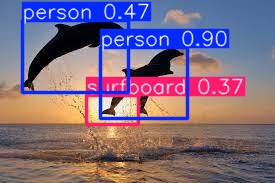

inference output img 2:
image 1/1: 750x750 2 cats, 1 dog
Speed: 16.8ms pre-process, 172.1ms inference, 1.0ms NMS per image at shape (1, 3, 640, 640)
         xmin        ymin        xmax        ymax  confidence  class name
0   11.464888  116.253998  313.464905  667.198853    0.650868     15  cat
1  363.661621  289.905151  750.000000  721.743103    0.502283     16  dog
2  311.703369  102.786827  594.888245  687.792908    0.389907     15  cat


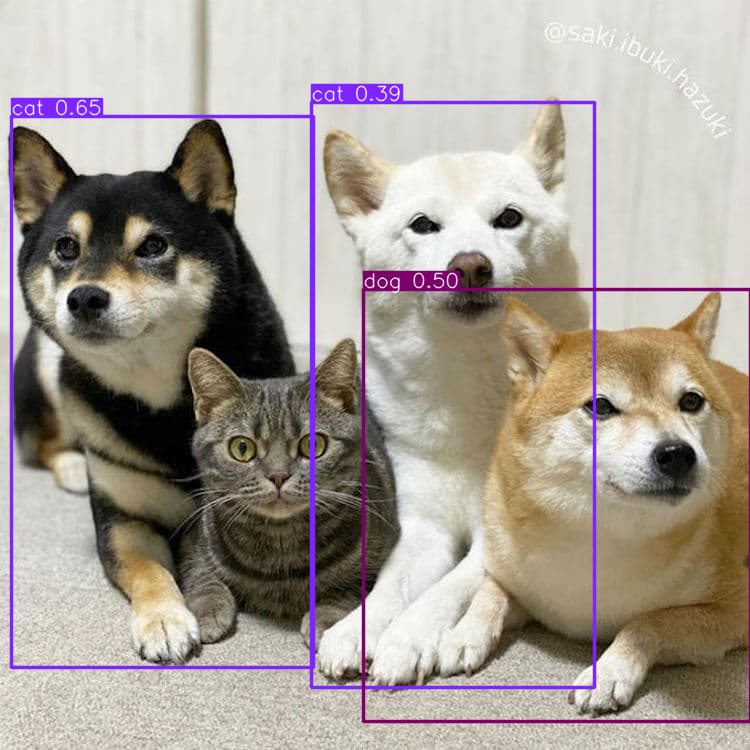

In [5]:
with torch.no_grad():
    #Detecting objects using YOLOv5
    objs_img1 = model(img1)
    objs_img2 = model(img2)

    #Printing inference output1 with bounding boxes
    print('inference output img 1:')
    print(objs_img1)
    print(objs_img1.pandas().xyxy[0])
    objs_img1.show()

    #Printing inference output2 with bounding boxes
    print('inference output img 2:')
    print(objs_img2)
    print(objs_img2.pandas().xyxy[0])
    objs_img2.show()

### Question 1

Analyze the inference results of the 2 images. 
1. How well did the model detect the objects in the pictures? with what confidance?
2. What can possibly be the reason for the model failures? suggest methods to resolve that issue.
3. recall that we learned how to fool a model by adverserial attack (PGD), describe how you would attack an Object Detection model (such as YOLO).

In [ ]:
#====
from cs236781.answers import display_answer
import hw2.answers
#====

display_answer(hw2.answers.part6_q1)

## Creative Detection Failures

<a id=part6_2></a>

Object detection pitfalls could be, for example: **occlusion** - when the objects are partially occlude, and thus missing important features, **model bias** - when a model learn some bias about an object, it could recognize it as something else in a different setup, and many others like **Deformation**, **Illumination conditions**, **Cluttered** or **textured background and blurring** due to moving objects.

**TODO**: Take pictures and that demonstrates 3 of the above object detection pitfalls, run inference and analyze the results.

C:\Users\urikh/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:898: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


image 1/1: 799x1200 5 persons, 2 sports balls
Speed: 47.7ms pre-process, 181.8ms inference, 1.0ms NMS per image at shape (1, 3, 448, 640)
          xmin        ymin         xmax        ymax  confidence  class  \
0   865.057251  261.469604   939.102722  335.467621    0.858558     32   
1   263.251617  266.038635   337.013702  336.763397    0.665832     32   
2   920.373840   15.244905  1198.283447  635.833191    0.662154      0   
3   432.289154   12.161065   676.290894  664.230103    0.632024      0   
4   711.021423   72.091797   923.945068  647.996643    0.608744      0   
5   709.205261    9.066325   917.105286  219.688126    0.426627      0   
6  1104.895874   18.513165  1199.242798  617.381104    0.266843      0   

          name  
0  sports ball  
1  sports ball  
2       person  
3       person  
4       person  
5       person  
6       person  


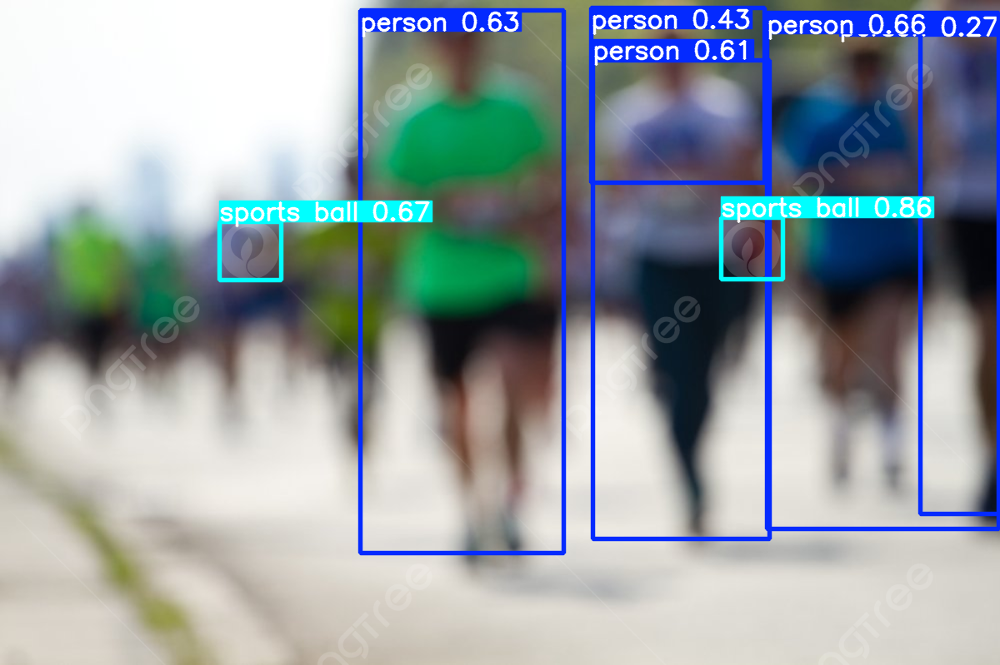

C:\Users\urikh/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:898: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


image 1/1: 720x1280 22 dogs, 1 cake, 16 teddy bears
Speed: 61.5ms pre-process, 117.2ms inference, 2.5ms NMS per image at shape (1, 3, 384, 640)
           xmin        ymin         xmax        ymax  confidence  class  \
0   1106.429565    3.279190  1278.363892  169.782211    0.785065     16   
1    916.121216    1.020439  1103.498535  163.119934    0.758326     16   
2    567.805664  352.891357   734.568237  534.694519    0.745124     16   
3    738.060608    0.000000   910.606384  164.670197    0.730857     16   
4    740.158203  352.242188   913.223877  529.114624    0.701224     16   
5    555.891296  550.524170   735.952576  709.096436    0.696720     77   
6    559.383301    2.270187   735.572266  158.185165    0.690165     16   
7   1111.764160  538.211121  1277.209717  706.426575    0.679150     77   
8    373.825012  165.903519   556.069824  345.615662    0.673425     16   
9    917.373901  538.528931  1102.159302  714.197144    0.666818     16   
10     1.440414  539.419250   1

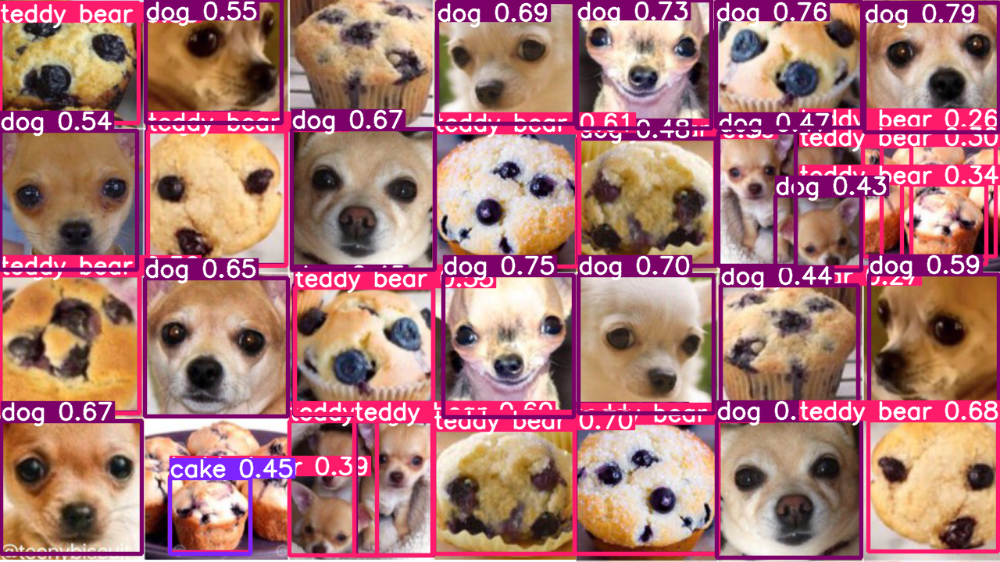

C:\Users\urikh/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:898: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


image 1/1: 4619x3079 10 persons, 1 cell phone
Speed: 253.5ms pre-process, 148.7ms inference, 2.5ms NMS per image at shape (1, 3, 640, 448)
           xmin         ymin         xmax         ymax  confidence  class  \
0   2532.339355  2508.018799  3079.000000  4619.000000    0.822547      0   
1   1276.803223  2191.491455  1826.878540  2920.614990    0.614120      0   
2   1566.888672  2559.658691  2587.254150  4619.000000    0.603849      0   
3    734.447815  3333.368164  2140.253662  4612.049316    0.589173      0   
4    944.155762  2185.212158  1370.714722  2872.818848    0.511329      0   
5   2368.724365  2420.361084  2854.457275  3325.851074    0.339761      0   
6   2709.721680  2143.614990  3038.747803  2541.520020    0.335357      0   
7     28.113886  2323.282959  1030.684692  4532.212891    0.283278      0   
8   1996.552002  2214.608643  2463.872314  3253.833008    0.274905      0   
9   2554.516357  2983.169189  2701.693115  3174.719238    0.262874     67   
10  1152.67028

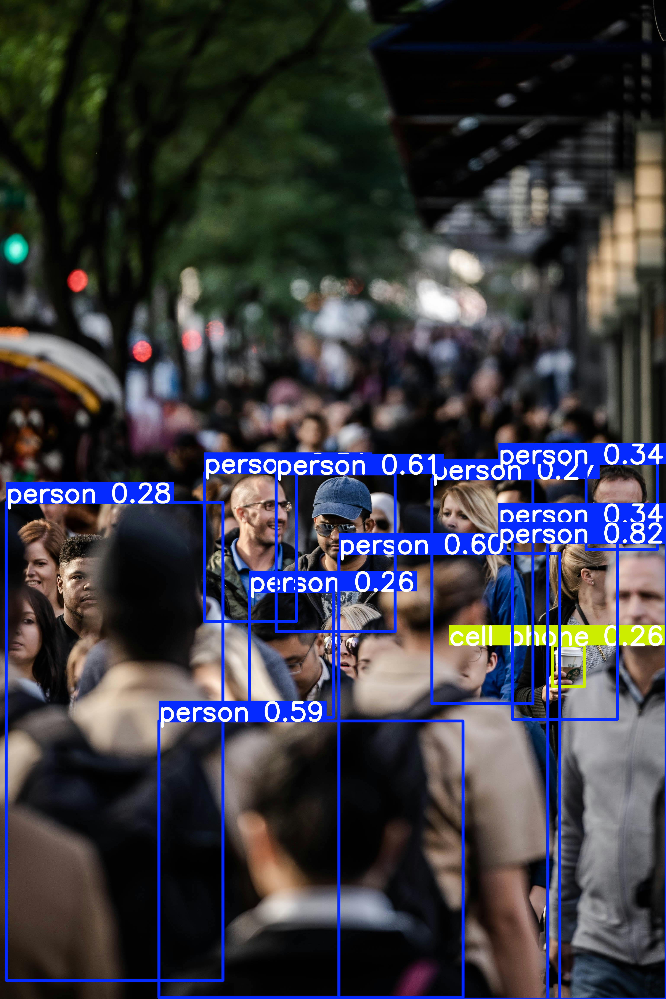

In [8]:
# You can change the images names in the code below, and add new ones

images = [
    "imgs/people detection.jpg",
    "imgs/chiuaua cookie.png",
    "imgs/occluding people.jpg"
]

with torch.no_grad():
    for img in images:
        objs_img = model(img)
        print(objs_img)
        print(objs_img.pandas().xyxy[0])
        objs_img.show()

### Question 3

Analyize the results of the inference. 
1. How well did the model detect the objects in the pictures? explain.


In [ ]:
display_answer(hw2.answers.part6_q3)


## Bonus 
<a id=part6_3></a>

Try improving the model performance over poorly recognized images by changing them. 
Describe the manipulations you did to the pictures.

In [ ]:
import cv2

#insert bonus code here



In [ ]:
display_answer(hw2.answers.part6_bonus)